Plotting software for MaP data
==============================
Patrick Irving, 5/19/2021

## Vision:
To enable fast and easy exploration of MaP experimental data.

## Name:
StarMapper: Secondary and Tertiary structural Annotations of RNA

## Motivation

* Weeks Lab GitHub has many highly specialized scripts.
  * plotting
  * filtering
  * file conversion
  * clipping structure cassettes
  * analysis
* If you know what you want ahead of time, and you know your way around GitHub, you can create a nice figure.
* Data exploration is difficult because we have too many scripts and create too many files.

## Solution: Jupyter Notebooks and StarMapper

Jupyter Notebooks come installed with Anaconda, and are accessible on Longleaf through [OpenOnDemand](https://ondemand.rc.unc.edu/).

StarMapper can be found in the [JNBTools repo on Github](https://github.com/Weeks-UNC/JNBTools).

## Jupyter Notebooks
- Really nice for anybody doing data analysis.
- Makes your analysis easily reproducible and human-readable.
- Do everything in one place.
- Text, code, and figures, all together.
- Exports to PDF, HTML, and HTML slide shows for sharing.
- This presentation is a Jupyter Notebook.

## starmapper.py
- Makes it easy:
  - Filtering data.
  - Analyzing data.
  - Plotting data.

### Filtering:
- Fits data by sequence
  - Done automatically any time you want to compare data.
  - no more clipping/padding for structure cassettes
  - not limited to structure cassettes
- Filter by any column in your data tables
  * Statistic, Z-score, Percentile, Deletion Rate, Read Depth, etc.
- Filter by contact distances
- Filter by 3-D distances
- Filter by Reactivity and single-strandedness (new feature today).

### Plotting:
starmapper.py includes a variety of tools for plotting:
- ShapeMapper QC data:
  - mutations per molecule
  - read length distribution
- 1-D Reactivity data:
  - SHAPE-MaP
  - DANCE-MaP
- 2-D correlation data:
  - Rings
  - Pairs
  - Deletions
  - DANCE-MaP

### Installation is simple
I'm happy to help with this. Instructions are on the GitHub page.

Notebook Setup
----------------------
The first code cell of a notebook should define defaults and load in modules

For high-level plotting functions, you only need to import StarMapper.

For this demonstration, I also need matplotlib.pyplot.

In [1]:
# Display plots in-line
%matplotlib inline

# import modules
import starmapper as MaP
import matplotlib.pyplot as plt

Initializing MaP.Sample
-----------------------
MaP.Sample is the core object in this package. For each MaP experimental sample, it holds the following information.
* Sample name
* Base-pairing information (.ct)
* Secondary Structure (.xrna, .varna, .cte, .nsd)
* Tertiary Structure (.pdb)
  * requires PDB entry name
* ShapeMapper Log file
* ShapeMapper Profile
* RingMapper data
* PairMapper data
* DANCE-MaP prefix:
  * Finds: reactivities, pairs, rings, allcorrs, and ct files if present.
* SHAPE-JuMP deletions data
  * requires a reference fasta file

In [3]:
example1 = MaP.Sample(sample="example1",
                      profile = 'data/example1_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example1-rnasep.corrs',
                      pairs = 'data/example1-rnasep-pairmap.txt',
                      log = 'data/example1_shapemapper_log.txt',
                      dance_prefix = 'data/example1_rnasep',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb')
example2 = MaP.Sample(sample="example2",
                      profile = 'data/example2_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example2-rnasep.corrs',
                      pairs = 'data/example2-rnasep-pairmap.txt',
                      log = 'data/example2_shapemapper_log.txt',
                      dance_prefix = 'data/example2_rnasep',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb')

In [4]:
example3 = MaP.Sample(sample="example3",
                      profile = 'data/example3_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example3-rnasep.corrs',
                      pairs = 'data/example3-rnasep-pairmap.txt',
                      log = 'data/example3_shapemapper_log.txt',
                      dance_prefix = 'data/example3_rnasep',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb')
example4 = MaP.Sample(sample="example4",
                      profile = 'data/example4_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example4-rnasep.corrs',
                      pairs = 'data/example4-rnasep-pairmap.txt',
                      log = 'data/example4_shapemapper_log.txt',
                      dance_prefix = 'data/example4_rnasep',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb')

High-level plotting functions
-----------------------------
- Single sample plotting:
  - sample.make_plot(arguments, filter arguments)
- Multi-sample plotting:
  - MaP.array_plot(samples, arguments, filter arguments)
- Plot can be:
    - log_qc
    - shapemapper
    - skyline
    - dance_skyline
    - heatmap
    - ap
    - ss
    - 3d

## ShapeMapper QC
* make_log_qc (high-level function)
  * plot_log_MutsPerMol
  * set_log_MutsPerMol
  * make_log_MutsPerMol
  * plot_log_ReadLength
  * set_log_ReadLength
  * make_log_ReadLength
  * get_boxplot_data
  * plot_boxplot
* array_qc

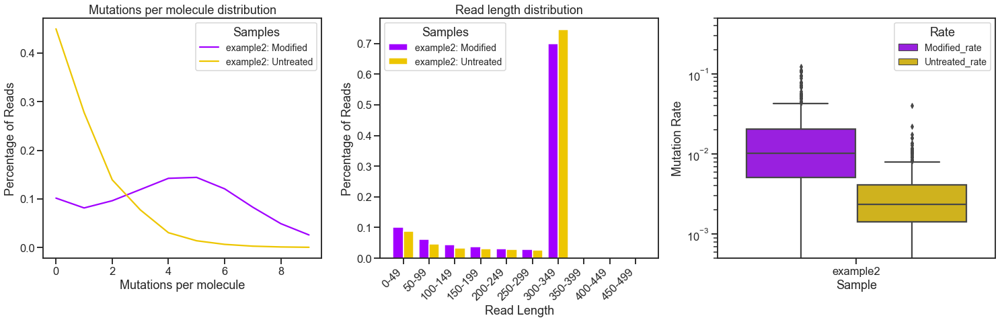

In [5]:
example2.make_log_qc();

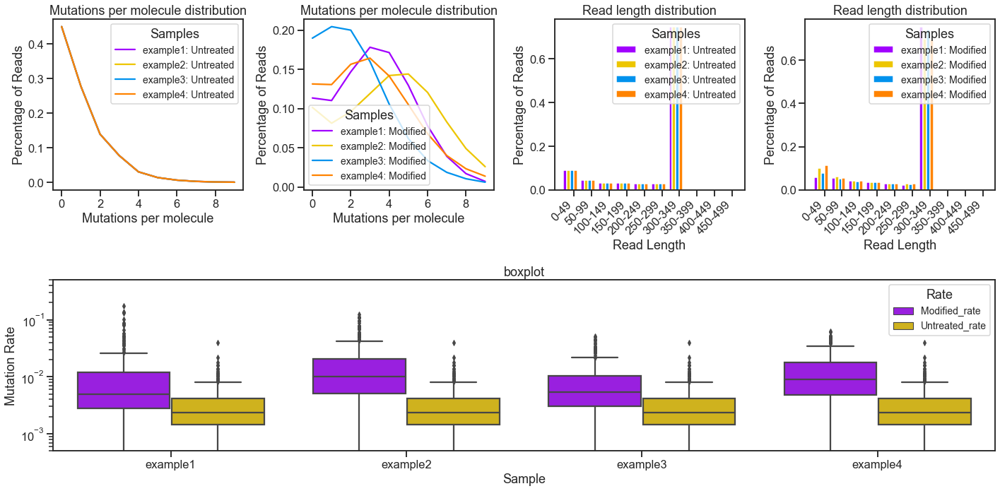

In [6]:
MaP.array_qc([example1, example2, example3, example4]);

## Linear Regressions
- plot_regression

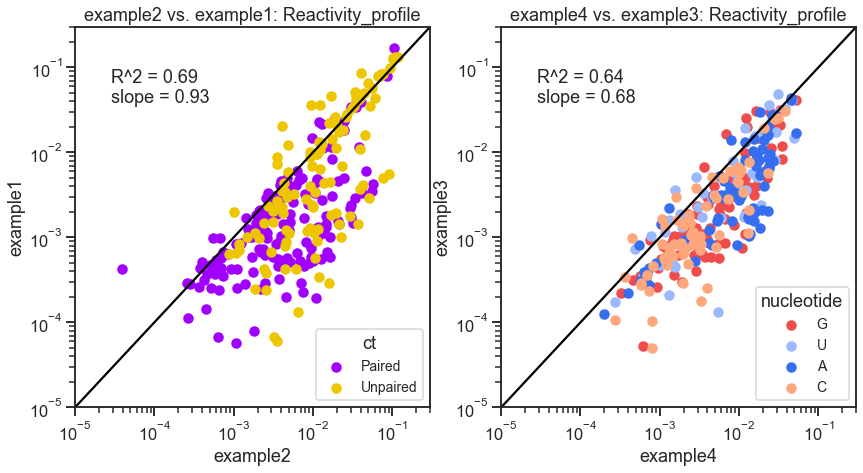

In [9]:
fig, ax = plt.subplots(1,2, figsize=(14,7))
example2.make_regression(example1, ax=ax[0])
example4.make_regression(example3, ax=ax[1], colorby="nucleotide")

Classic ShapeMapper Plots
-------------------------
* make_shapemapper
  * plot_sm_profile
  * plot_sm_depth
  * plot_sm_rates

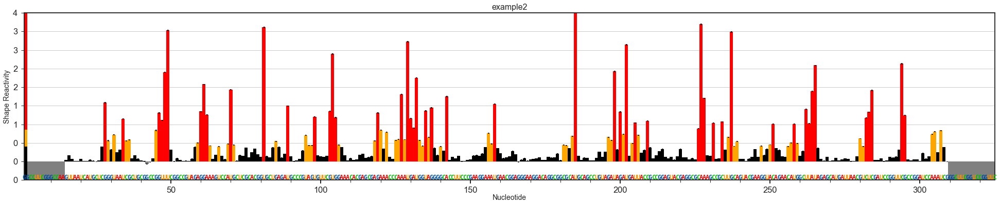

In [10]:
example2.plot_sm_profile();

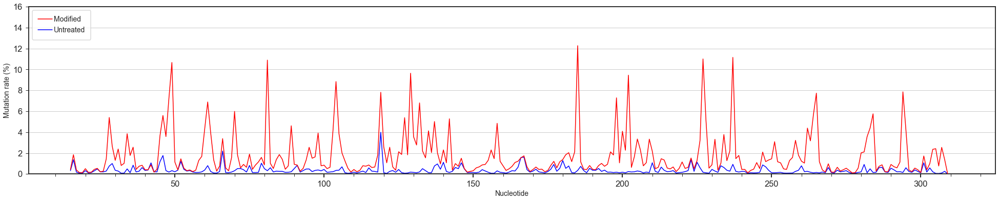

In [11]:
example2.plot_sm_rates();

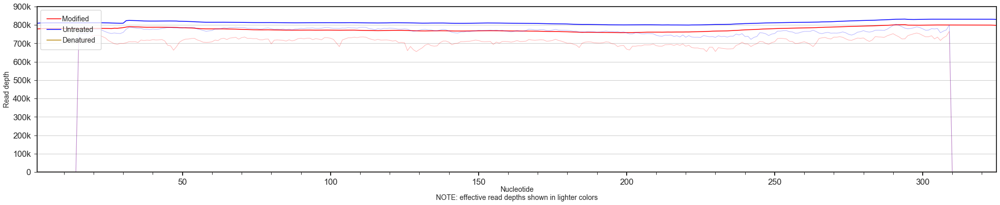

In [12]:
example2.plot_sm_depth();

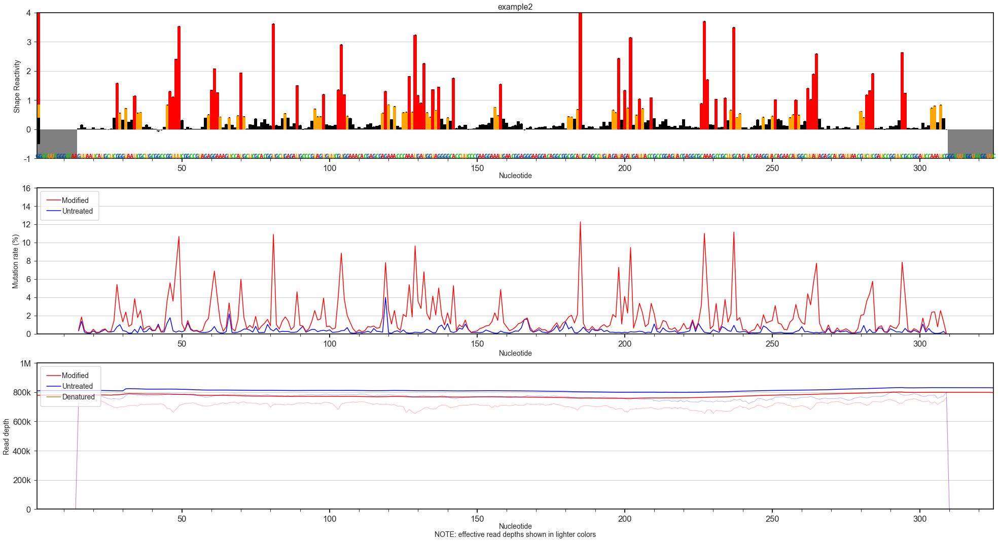

In [13]:
example2.make_shapemapper();

## Skyline Plots
* make_skyline
* make_dance_skyline
  * get_skyline_figsize
  * plot_skyline
  * plot_sequence
* array_skyline

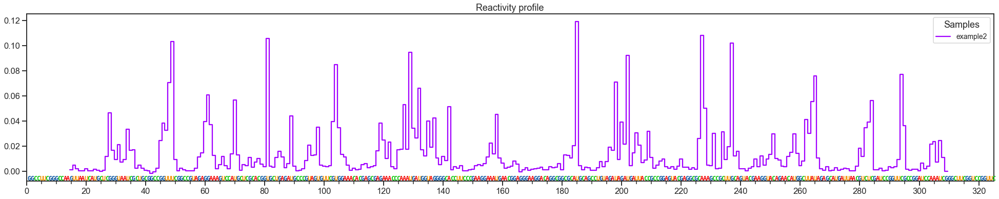

In [14]:
example2.make_skyline();

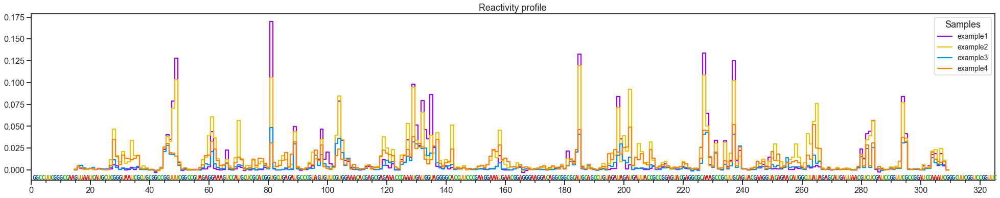

In [15]:
MaP.array_skyline([example1, example2, example3, example4]);

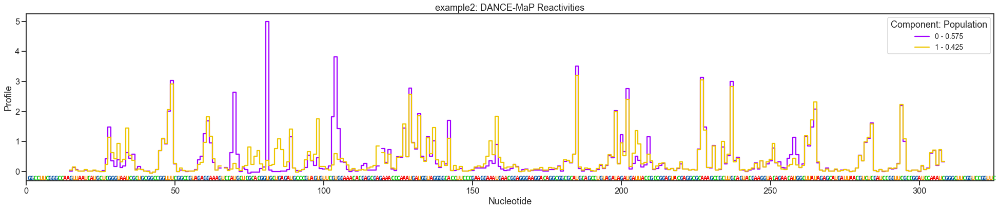

In [16]:
example2.make_dance_skyline();

In [17]:
plt.close('all');

## Colorbars
The plots I'll be showing don't have colorbars yet. To get a stand-alone colorbar, use the view_colormap() function:

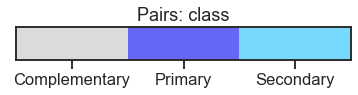

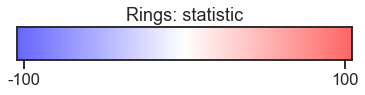

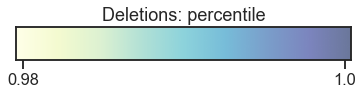

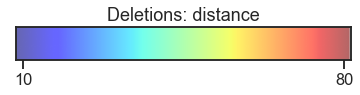

In [18]:
MaP.view_colormap("pairs")
MaP.view_colormap("rings")
MaP.view_colormap("deletions")
MaP.view_colormap("deletions", metric="Distance")

## Heatmap and Contour Plots
* make_heatmap
  * get_distance_matrix
    * This function is faster than calling ct.contactDistance(i,j) pairwise
    * For RNaseP (325 nt) ~5 sec vs. ~1 min
  * plot_contour_distances
  * plot_heatmap_data

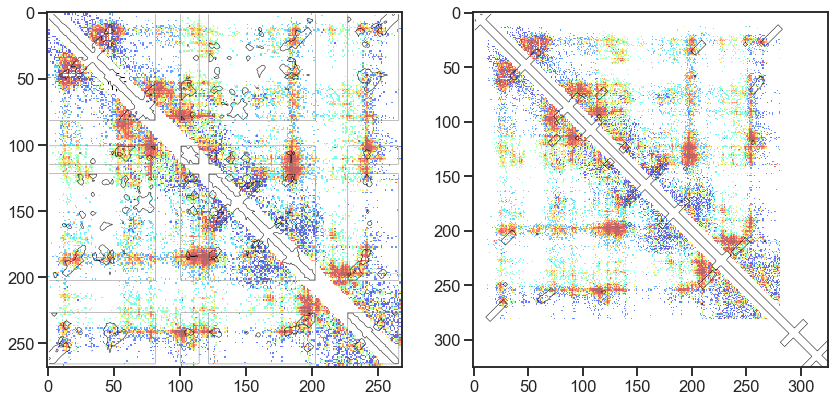

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(14, 7))
example2.make_heatmap("deletions", "pdb", ax=ax[0])
example2.make_heatmap("deletions", "ct", ax=ax[1]);

## Arc Plots
* make_ap
  * add_arc
  * get_ap_figsize
  * set_ap
  * plot_ap_ct
  * plot_ap_ctcompare
  * plot_ap_profile
  * plot_ap_data
* array_ap
  * make_ap

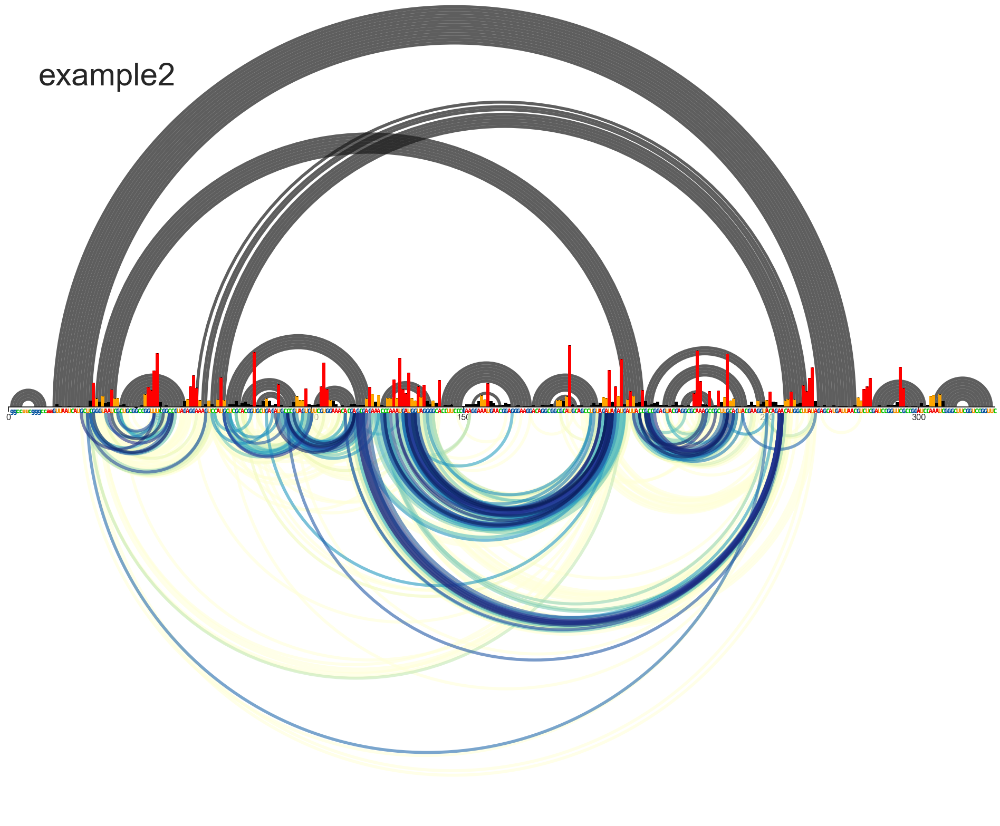

In [20]:
example2.make_ap(ij_data="deletions", Percentile=0.95);

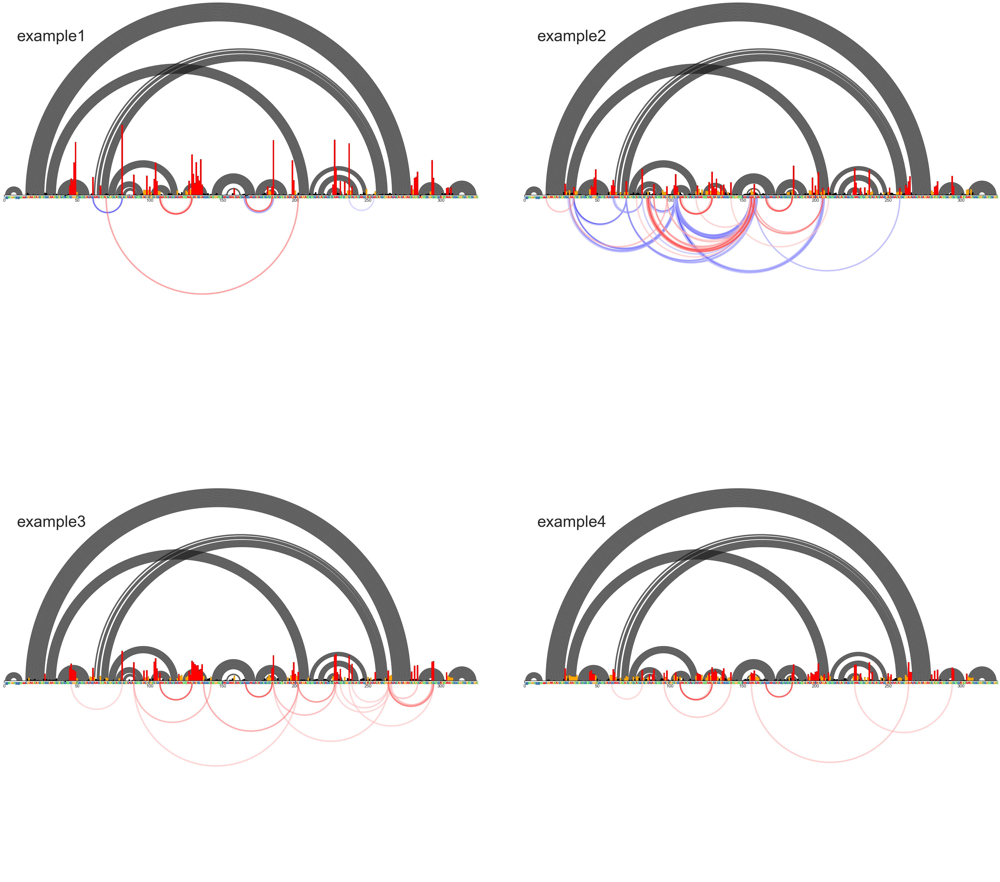

In [21]:
MaP.array_ap([example1, example2, example3, example4], ij_data="rings", cdAbove=15);

## Secondary Structure
- make_ss
  - set_ss
  - plot_ss_structure
  - plot_ss_sequence
  - plot_ss_positions
  - set_3d_distances (if coloring by 3d distance)
  - plot_ss_data
- array_ss
  - make_ss

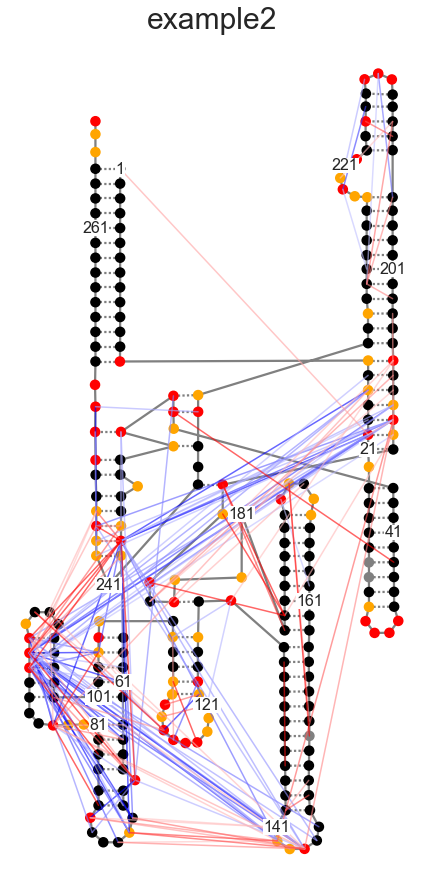

In [22]:
example2.make_ss(ij_data="rings");

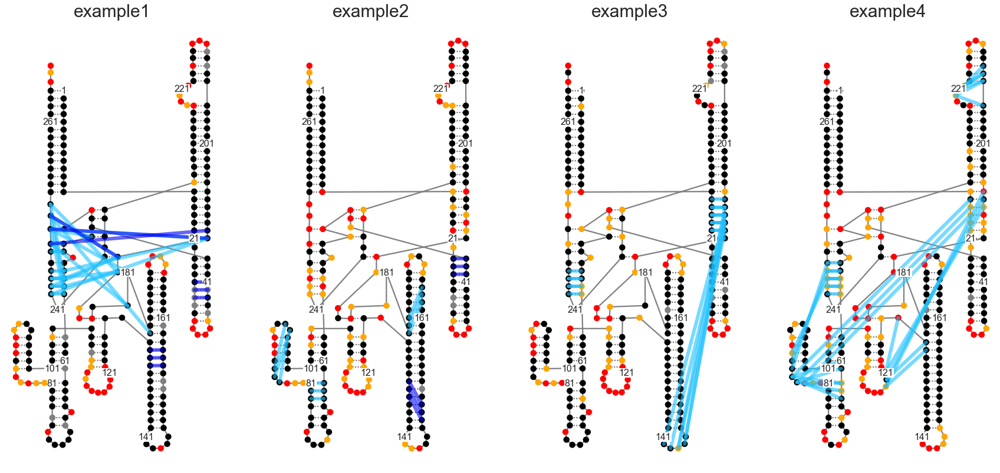

In [23]:
MaP.array_ss([example1, example2, example3, example4], ij_data="pairs");

In [24]:
plt.close('all')

3D molecule interactive plots
-----------------------------
Controls:
* click and drag to rotate
* mouse scroll or right click to zoom
* 3rd mouse button and drag to pan


In [27]:
example2.make_3d(ij_data="deletions", metric="Distance", Percentile=0.99)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [28]:
MaP.array_3d([example1, example2, example3, example4], ij_data="rings", Statistic=15)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Review
StarMapper and Jupyter Notebooks provides a fast and easy way to explore MaP and JuMP data sets.
* Quality contol
* Skylines
* Linear Regression scatter plots
* Arc Plots
* Heatmaps
* Secondary Structure
* 3D structure
* etc.

## Still left to do:
- Improve look and readability of some figures.
- Add functionality that is commonly used in lab, but not by me.
- Create a command line interface.
- Taking requests.
  - e.g. Dan's request from yesterday. (filter Rings by profile and single-strandedness)

In [29]:
example2.print_new_ij_file("rings", cdAbove=30, cdBelow=80, Statistic=30, Mod_Comuts=300, ss_only=True, profAbove=0.5, profBelow=2)

325	Window=1	Metric=APC
 i	j	Statistic	+/-	Zij	Zi	Zj	Mod_Depth	Mod_Comuts	Unt_Depth	Unt_Comuts
85	158	74.47	1	4.21	3.41	5.02	290595	422	321178	5
89	156	48.02	1	4.32	5.34	3.31	294128	446	322918	1
89	158	39.7	1	3.53	4.4	2.65	295731	856	322888	3
98	158	37.13	1	2.01	1.54	2.47	298273	755	325757	4



## What I need from the Weeks Lab
* Testing, figuring out when my code fails.
* Looking out for unexpected behavior.
  * i, j slipping (0-index vs. 1-index)
  * filtering out things you don't want filtered.
* Ideas for improving the look and readability of plots.
* StarMapper is very extensible. New functions should be added to it instead of creating new scripts.